In [87]:
# Importando e instalando bibliotecas
!pip install lasio
import pandas as pd
import matplotlib.pyplot as plt
import lasio
import numpy as np

import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

In [33]:
# Carregando well log .LAS
las = lasio.read('1-ALV-2-BA.las')

## Analisando a forma como o dado é importado

In [152]:
# Cada section compreende uma biblioteca
las.sections

{'Version': [HeaderItem(mnemonic="VERS", unit="", value="3.0", descr="CWLS LOG ASCII STANDA"),
  HeaderItem(mnemonic="WRAP", unit="", value="NO", descr="ONE LINE PER DEPTH STE"),
  HeaderItem(mnemonic="DLM", unit="", value="SPACE", descr="DELIMITING CHARACTER")],
 'Well': [HeaderItem(mnemonic="STRT", unit="m", value="3.81", descr="First reference val"),
  HeaderItem(mnemonic="STOP", unit="m", value="2245.7664", descr="Last reference"),
  HeaderItem(mnemonic="STEP", unit="m", value="0.1524", descr="Step increment"),
  HeaderItem(mnemonic="NULL", unit="", value="-9999", descr="Missing value"),
  HeaderItem(mnemonic="COMP", unit="", value="", descr="Company"),
  HeaderItem(mnemonic="WELL", unit="", value="1-ALV-2-BA", descr="Well name"),
  HeaderItem(mnemonic="FLD", unit="", value="REC-T-155", descr="Field"),
  HeaderItem(mnemonic="LOC", unit="", value="", descr="Location"),
  HeaderItem(mnemonic="SRVC", unit="", value="", descr="Service Company"),
  HeaderItem(mnemonic="CTRY", unit="", v

In [34]:
# Diferentes seções de um .LAS
las.sections.keys()

dict_keys(['Version', 'Well', 'Curves', 'Parameter', 'Other'])

<img src='las_exemplo.PNG' style='width:600px;height:600px'/>

In [35]:
type(las)

lasio.las.LASFile

In [36]:
type(las.sections['Curves'])

lasio.las_items.SectionItems

In [37]:
las.sections['Curves']

[CurveItem(mnemonic="MD", unit="m", value="", descr="{F}", original_mnemonic="MD", data.shape=(14712,)),
 CurveItem(mnemonic="DENS", unit="g/cm3", value="", descr="{F}", original_mnemonic="DENS", data.shape=(14712,)),
 CurveItem(mnemonic="GR", unit="gAPI", value="", descr="{F}", original_mnemonic="GR", data.shape=(14712,)),
 CurveItem(mnemonic="ILD", unit="ohm.m", value="", descr="{F}", original_mnemonic="ILD", data.shape=(14712,)),
 CurveItem(mnemonic="ILM", unit="ohm.m", value="", descr="{F}", original_mnemonic="ILM", data.shape=(14712,)),
 CurveItem(mnemonic="NEU", unit="m3/m3", value="", descr="{F}", original_mnemonic="NEU", data.shape=(14712,)),
 CurveItem(mnemonic="POROSITY-DENSITY", unit="v/v", value="", descr="{F}", original_mnemonic="POROSITY-DENSITY", data.shape=(14712,)),
 CurveItem(mnemonic="VSH_GR", unit="v/v", value="", descr="{F}", original_mnemonic="VSH_GR", data.shape=(14712,))]

In [38]:
for item in las.sections['Well']:
    print(f'{item.descr} ({item.mnemonic}): \t \t \t \t {item.value}')

First reference value (STRT): 	 	 	 	 3.81
Last reference value (STOP): 	 	 	 	 2245.7664
Step increment (STEP): 	 	 	 	 0.1524
Missing value (NULL): 	 	 	 	 -9999
Company (COMP): 	 	 	 	 
Well name (WELL): 	 	 	 	 1-ALV-2-BA
Field (FLD): 	 	 	 	 REC-T-155
Location (LOC): 	 	 	 	 
Service Company (SRVC): 	 	 	 	 
Country (CTRY): 	 	 	 	 
Service Date (DATE): 	 	 	 	 
X or East-West coordinate (X): 	 	 	 	 
Y or North South coordinate (Y): 	 	 	 	 
Geodetic Datum (GDAT): 	 	 	 	 
Horizontal Co-ordinate System (HZCS): 	 	 	 	 
 (COMPANY): 	 	 	 	 ALVORADA
 (CREATION-TIME): 	 	 	 	 2021/8/18 13_56
 (FIELD-NAME): 	 	 	 	 REC-T-155
 (FILE-ID): 	 	 	 	 ALV2FM.001
 (FILE-NUMBER): 	 	 	 	 2
 (FILE-SET-NAME): 	 	 	 	 LIS-TO-DLIS-CONVERSION
 (FILE-SET-NUMBER): 	 	 	 	 8788
 (FILE-TYPE): 	 	 	 	 OAKSFT
 (NAME-SPACE-NAME): 	 	 	 	 
 (NAME-SPACE-VERSION): 	 	 	 	 0
 (PRODUCER-CODE): 	 	 	 	 440
 (PRODUCER-NAME): 	 	 	 	 Schlumberger
 (PRODUCT): 	 	 	 	 DLIS/U
 (PROGRAMS): 	 	 	 	 LIS-TO-DLIS
 (VERS

### Alterando parâmetros no cabeçalho do LAS

In [39]:
las.sections['Well']['CTRY'] = 'Brazil'

In [40]:
# Conferindo alteração
for item in las.sections['Well']:
    print(f'{item.descr} ({item.mnemonic}): \t \t \t \t {item.value}')

First reference value (STRT): 	 	 	 	 3.81
Last reference value (STOP): 	 	 	 	 2245.7664
Step increment (STEP): 	 	 	 	 0.1524
Missing value (NULL): 	 	 	 	 -9999
Company (COMP): 	 	 	 	 
Well name (WELL): 	 	 	 	 1-ALV-2-BA
Field (FLD): 	 	 	 	 REC-T-155
Location (LOC): 	 	 	 	 
Service Company (SRVC): 	 	 	 	 
Country (CTRY): 	 	 	 	 Brazil
Service Date (DATE): 	 	 	 	 
X or East-West coordinate (X): 	 	 	 	 
Y or North South coordinate (Y): 	 	 	 	 
Geodetic Datum (GDAT): 	 	 	 	 
Horizontal Co-ordinate System (HZCS): 	 	 	 	 
 (COMPANY): 	 	 	 	 ALVORADA
 (CREATION-TIME): 	 	 	 	 2021/8/18 13_56
 (FIELD-NAME): 	 	 	 	 REC-T-155
 (FILE-ID): 	 	 	 	 ALV2FM.001
 (FILE-NUMBER): 	 	 	 	 2
 (FILE-SET-NAME): 	 	 	 	 LIS-TO-DLIS-CONVERSION
 (FILE-SET-NUMBER): 	 	 	 	 8788
 (FILE-TYPE): 	 	 	 	 OAKSFT
 (NAME-SPACE-NAME): 	 	 	 	 
 (NAME-SPACE-VERSION): 	 	 	 	 0
 (PRODUCER-CODE): 	 	 	 	 440
 (PRODUCER-NAME): 	 	 	 	 Schlumberger
 (PRODUCT): 	 	 	 	 DLIS/U
 (PROGRAMS): 	 	 	 	 LIS-TO-DLIS


### Nome do poço

In [41]:
las.well['Well']['value']

'1-ALV-2-BA'

### Acessando os Mnemonicos

In [157]:
las.curves
# curves é uma lista dentro de las
# Cada Log dentro de las.curves compreende um item de uma lista

[CurveItem(mnemonic="MD", unit="m", value="", descr="Profundidade", original_mnemonic="MD", data.shape=(14712,)),
 CurveItem(mnemonic="DENS", unit="g/cm3", value="", descr="Densidade", original_mnemonic="DENS", data.shape=(14712,)),
 CurveItem(mnemonic="GR", unit="gAPI", value="", descr="Gamma Ray", original_mnemonic="GR", data.shape=(14712,)),
 CurveItem(mnemonic="ILD", unit="ohm.m", value="", descr="Resistividade Profunda", original_mnemonic="ILD", data.shape=(14712,)),
 CurveItem(mnemonic="ILM", unit="ohm.m", value="", descr="Resistividade Média", original_mnemonic="ILM", data.shape=(14712,)),
 CurveItem(mnemonic="NEU", unit="m3/m3", value="", descr="Densidade de Neutrão", original_mnemonic="NEU", data.shape=(14712,)),
 CurveItem(mnemonic="POROSITY-DENSITY", unit="v/v", value="", descr="Porosidade por Densidade", original_mnemonic="POROSITY-DENSITY", data.shape=(14712,)),
 CurveItem(mnemonic="VSH_GR", unit="v/v", value="", descr="Volume de argila/GR", original_mnemonic="VSH_GR", dat

In [42]:
for curve in las.curves:
    print(curve['mnemonic'])

MD
DENS
GR
ILD
ILM
NEU
POROSITY-DENSITY
VSH_GR


In [43]:
for count, curve in enumerate(las.curves):
    print(f'Curve: {curve.mnemonic} \t Units: {curve.unit} \t Description: {curve.descr}')
print(f'Existem no total: {count+1} curvas no arquivo.')

Curve: MD 	 Units: m 	 Description: {F}
Curve: DENS 	 Units: g/cm3 	 Description: {F}
Curve: GR 	 Units: gAPI 	 Description: {F}
Curve: ILD 	 Units: ohm.m 	 Description: {F}
Curve: ILM 	 Units: ohm.m 	 Description: {F}
Curve: NEU 	 Units: m3/m3 	 Description: {F}
Curve: POROSITY-DENSITY 	 Units: v/v 	 Description: {F}
Curve: VSH_GR 	 Units: v/v 	 Description: {F}
Existem no total: 8 curvas no arquivo.


### Corrigindo a coluna Descrição

In [44]:
descricao = ['Profundidade', 'Densidade', 'Gamma Ray', 'Resistividade Profunda',
             'Resistividade Média', 'Densidade de Neutrão', 'Porosidade por Densidade', 'Volume de argila/GR']

In [45]:
las.sections['Curves']

[CurveItem(mnemonic="MD", unit="m", value="", descr="{F}", original_mnemonic="MD", data.shape=(14712,)),
 CurveItem(mnemonic="DENS", unit="g/cm3", value="", descr="{F}", original_mnemonic="DENS", data.shape=(14712,)),
 CurveItem(mnemonic="GR", unit="gAPI", value="", descr="{F}", original_mnemonic="GR", data.shape=(14712,)),
 CurveItem(mnemonic="ILD", unit="ohm.m", value="", descr="{F}", original_mnemonic="ILD", data.shape=(14712,)),
 CurveItem(mnemonic="ILM", unit="ohm.m", value="", descr="{F}", original_mnemonic="ILM", data.shape=(14712,)),
 CurveItem(mnemonic="NEU", unit="m3/m3", value="", descr="{F}", original_mnemonic="NEU", data.shape=(14712,)),
 CurveItem(mnemonic="POROSITY-DENSITY", unit="v/v", value="", descr="{F}", original_mnemonic="POROSITY-DENSITY", data.shape=(14712,)),
 CurveItem(mnemonic="VSH_GR", unit="v/v", value="", descr="{F}", original_mnemonic="VSH_GR", data.shape=(14712,))]

Lembrando que cada Log pode ser acessado como diferentes itens de uma Lista chamada 'curves':

In [46]:
las.curves[0]

CurveItem(mnemonic="MD", unit="m", value="", descr="{F}", original_mnemonic="MD", data.shape=(14712,))

In [47]:
las.curves[1]

CurveItem(mnemonic="DENS", unit="g/cm3", value="", descr="{F}", original_mnemonic="DENS", data.shape=(14712,))

Executando alteração:

In [48]:
# loop para alterar os valores de 'descr'
# lembrando: enumerate() associa um contador à iteração
for x, item in enumerate(descricao):
    las.curves[x].descr = item

In [49]:
for count, curve in enumerate(las.curves):
    print(f'Curve: {curve.mnemonic} \t Units: {curve.unit} \t Description: {curve.descr}')
print(f'Existem no total: {count+1} curvas no arquivo.')

Curve: MD 	 Units: m 	 Description: Profundidade
Curve: DENS 	 Units: g/cm3 	 Description: Densidade
Curve: GR 	 Units: gAPI 	 Description: Gamma Ray
Curve: ILD 	 Units: ohm.m 	 Description: Resistividade Profunda
Curve: ILM 	 Units: ohm.m 	 Description: Resistividade Média
Curve: NEU 	 Units: m3/m3 	 Description: Densidade de Neutrão
Curve: POROSITY-DENSITY 	 Units: v/v 	 Description: Porosidade por Densidade
Curve: VSH_GR 	 Units: v/v 	 Description: Volume de argila/GR
Existem no total: 8 curvas no arquivo.


### Deletando curvas

In [50]:
#las.delete_curve('mnemonic')

### Exportando o arquivo Las

In [51]:
#las.write('caminho/nome_do_poco.las')

## Convertendo LAS em Pandas DataFrame

In [52]:
well = las.df()

Explorando o DataFrame

In [53]:
well.head()

,DENS,GR,ILD,ILM,NEU,POROSITY-DENSITY,VSH_GR
MD,,,,,,,
3.8100,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3.9624,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4.1148,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4.2672,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4.4196,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [54]:
well.tail()

,DENS,GR,ILD,ILM,NEU,POROSITY-DENSITY,VSH_GR
MD,,,,,,,
2245.1568,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2245.3092,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2245.4616,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2245.6140,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2245.7664,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Observe que os -999 foram convertidos em 'NaN'

In [55]:
well.describe()

,DENS,GR,ILD,ILM,NEU,POROSITY-DENSITY,VSH_GR
count,7303.000000,14582.000000,11773.000000,11781.000000,7283.000000,7271.000000,11599.000000
mean,2.532359,59.150312,6.792009,16.749459,24.642476,0.071582,0.625658
std,0.071275,22.461530,205.814736,372.057697,9.540318,0.042550,0.199973
min,2.172968,9.904538,0.381091,0.434117,-0.005261,0.000000,0.025524
25%,2.480328,41.961970,1.713314,1.720467,15.957955,0.039709,0.492017
50%,2.536462,59.993195,2.119830,2.138058,26.020800,0.068615,0.613509
75%,2.584346,76.834138,2.913234,2.976667,33.468245,0.102865,0.792035
max,2.747859,205.164400,10000.000000,10000.000000,43.705800,0.289110,1.000000


In [56]:
well.info()  #permite avaliar quantos valores não-nulos existem em cada coluna

<class 'pandas.core.frame.DataFrame'>
Float64Index: 14712 entries, 3.81 to 2245.7664
Data columns (total 7 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   DENS              7303 non-null   float64
 1   GR                14582 non-null  float64
 2   ILD               11773 non-null  float64
 3   ILM               11781 non-null  float64
 4   NEU               7283 non-null   float64
 5   POROSITY-DENSITY  7271 non-null   float64
 6   VSH_GR            11599 non-null  float64
dtypes: float64(7)
memory usage: 919.5 KB


In [57]:
well.shape

(14712, 7)

In [60]:
well.keys()

Index(['DENS', 'GR', 'ILD', 'ILM', 'NEU', 'POROSITY-DENSITY', 'VSH_GR'], dtype='object')

## Plotando primeiras curvas

<AxesSubplot:xlabel='MD'>

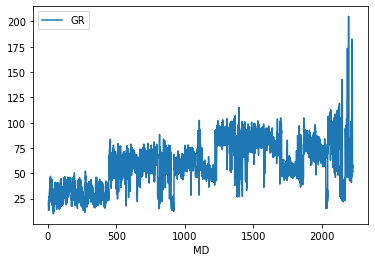

In [62]:
well.plot(y='GR')

<AxesSubplot:xlabel='MD'>

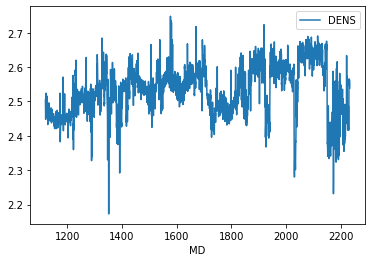

In [64]:
well.plot(y='DENS')

### Usando Plotly

In [142]:
GR_fig = px.line(well, x='GR', y=well.index, range_x = [0, 150], width= 400, height= 800)  #criando a figura
GR_fig.show()

### Fazendo subplots

In [115]:
# Criando a figura e definindo o número de tracks(=cols) e linhas do plot
fig = make_subplots(rows=1, cols=3)

# Definindo os elementos de cada gráfico
# Obs.: prestar atenção no fechamento dos parênteses. Pouco intuitivo!
fig.add_trace(go.Scatter(x=well['GR'], y=well.index), row=1, col=1)
fig.add_trace(go.Scatter(x=well['ILD'], y=well.index), row=1, col=2)
fig.add_trace(go.Scatter(x=well['DENS'], y=well.index), row=1, col=3)

### Sincronizando o eixo de profundidade

#### Problema:
Até o momentos os eixos de profundidade são indepentende! Isso será corrigido abaixo

In [124]:
# Os eixos são sincronizados a partir do argumento 'shared_yaxes=True' da função make_subplots()
fig = make_subplots(rows=1, cols=3, shared_yaxes=True)

fig.add_trace(go.Scatter(x=well['GR'], y=well.index), row=1, col=1)
fig.add_trace(go.Scatter(x=well['ILD'], y=well.index), row=1, col=2)
fig.add_trace(go.Scatter(x=well['DENS'], x=well[''], y=well.index), row=1, col=3)

### Customizando o gráfico

### Título

In [141]:
# título dos eixos x, definindo as escalas de cada log e especificando a escala logarítmica
fig.update_xaxes(title_text='GR', range=[0, 150],row=1, col=1)
fig.update_xaxes(title_text='ILD', range=[0.2, 2], type='log', row=1, col=2)
fig.update_xaxes(title_text='DENS', range = [1.65, 2.65], row=1, col=3)

# título do eixo y e inversão do eixo y
fig.update_yaxes(title_text='Profundidade (m)', autorange='reversed', row=1, col=1)

# inserindo Título Principal na figura, centralizando-o e alterando o tamanho dos gráficos
fig.update_layout(title_text='1-ALV-2-BA Log plot', title_x=0.5,height=900)

fig.show()

### Plotando mais de uma curva no mesmo track

Para isso, basta inserir mais uma linha com a função '.add_trace()' chamando a nova curva! Como abaixo:

In [148]:
# Criando novamente a figura
fig = make_subplots(rows=1, cols=3)

# inserindo curvas
fig.add_trace(go.Scatter(x=well['GR'], y=well.index), row=1, col=1)
fig.add_trace(go.Scatter(x=well['ILD'], y=well.index), row=1, col=2)
fig.add_trace(go.Scatter(x=well['DENS'], y=well.index), row=1, col=3)
fig.add_trace(go.Scatter(x=well['NEU'], y=well.index), row=1, col=3)

# título dos eixos x, definindo as escalas de cada log e especificando a escala logarítmica
'''fig.update_xaxes(title_text='GR', range=[0, 150],row=1, col=1)
fig.update_xaxes(title_text='ILD', range=[0.2, 2], type='log', row=1, col=2)
fig.update_xaxes(title_text='DENS/NEU', range = [1.65, 2.65], row=1, col=3)'''

# título do eixo y e inversão do eixo y
fig.update_yaxes(title_text='Profundidade (m)', autorange='reversed', row=1, col=1)

# inserindo Título Principal na figura, centralizando-o e alterando o tamanho dos gráficos
fig.update_layout(title_text='1-ALV-2-BA Log plot', title_x=0.5,height=900)

fig.show()

Não consegui definir escalas diferentes para DENS e NEU que estão no mesmo track... Em busca de solução!